# Suicide Ideation in Society : A Multivariate Analysis

 Data Visualization and Analysis 

In [1]:
# Loading necessary modules
import pandas as pd              # data processing; csv file i/o (pd.read_csv)
import numpy as np               # linear algebra
import matplotlib.pyplot as plt  # data visualization
import seaborn as sns
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()

In [2]:
# Loading the dataset
df = pd.read_csv('C:/Users/Dell-pc/Desktop/Minor Project/Dataset/Suicides in India 2001-2012.csv')


In [3]:
# Dimensions of dataset
df.shape

(237519, 7)

In [4]:
# A Look at the Dataset : First 5 rows ; Last 5 rows
df.head()

,State,Year,Type_code,Type,Gender,Age_group,Total
0,A & N Islands,2001,Causes,Illness (Aids/STD),Female,0-14,0
1,A & N Islands,2001,Causes,Bankruptcy or Sudden change in Economic,Female,0-14,0
2,A & N Islands,2001,Causes,Cancellation/Non-Settlement of Marriage,Female,0-14,0
3,A & N Islands,2001,Causes,Physical Abuse (Rape/Incest Etc.),Female,0-14,0
4,A & N Islands,2001,Causes,Dowry Dispute,Female,0-14,0


In [5]:
df.tail()

,State,Year,Type_code,Type,Gender,Age_group,Total
237514,West Bengal,2012,Social_Status,Seperated,Male,0-100+,149
237515,West Bengal,2012,Social_Status,Widowed/Widower,Male,0-100+,233
237516,West Bengal,2012,Social_Status,Married,Male,0-100+,5451
237517,West Bengal,2012,Social_Status,Divorcee,Male,0-100+,189
237518,West Bengal,2012,Social_Status,Never Married,Male,0-100+,2658


In [6]:
# Data types
df.dtypes

State        object
Year          int64
Type_code    object
Type         object
Gender       object
Age_group    object
Total         int64
dtype: object

In [7]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237519 entries, 0 to 237518
Data columns (total 7 columns):
State        237519 non-null object
Year         237519 non-null int64
Type_code    237519 non-null object
Type         237519 non-null object
Gender       237519 non-null object
Age_group    237519 non-null object
Total        237519 non-null int64
dtypes: int64(2), object(5)
memory usage: 12.7+ MB


In [8]:
# Extracting Useful data 
df = df[(df.Total!=0)|(df.State=='Total (All India)')|(df.State=='Total (States)')|(df.State=='Total (Uts)')]       #using boolean indexing 

In [9]:
# Dimension of useful data
df.shape

(102046, 7)

In [10]:
df.head()

,State,Year,Type_code,Type,Gender,Age_group,Total
13,A & N Islands,2001,Causes,Love Affairs,Female,0-14,1
20,A & N Islands,2001,Causes,Other Causes (Please Specity),Female,0-14,1
32,A & N Islands,2001,Causes,Other Prolonged Illness,Male,0-14,1
47,A & N Islands,2001,Causes,Failure in Examination,Male,0-14,1
54,A & N Islands,2001,Causes,Other Prolonged Illness,Female,15-29,8


In [11]:
df.isnull().sum()        # no. of missing values in each column ; no missing value found

State        0
Year         0
Type_code    0
Type         0
Gender       0
Age_group    0
Total        0
dtype: int64

In [12]:
df1 = df[(df.State =='Total (All India)')|(df.State =='Total (States)')|(df.State =='Total (Uts)')]   #dataframe object df1 contain data of whole country/state/region
df1.shape

(936, 7)

In [13]:
df1.head()

,State,Year,Type_code,Type,Gender,Age_group,Total
209476,Total (All India),2001,Education_Status,Hr. Secondary/Intermediate/Pre-Universit,Female,0-100+,2391
209477,Total (All India),2001,Education_Status,Diploma,Female,0-100+,294
209478,Total (All India),2001,Education_Status,Matriculate/Secondary,Female,0-100+,5486
209479,Total (All India),2001,Education_Status,No Education,Female,0-100+,12817
209480,Total (All India),2001,Education_Status,Post Graduate and Above,Female,0-100+,192


In [14]:
df = df[(df['State'] != 'Total (All India)')&(df['State'] != 'Total (States)')&(df['State'] != 'Total (Uts)')]  # df contains rest data other than df1
df.shape

(101110, 7)

In [10]:
#Heatmap showing the Top 5 states with high rate of suicide- year wise analysis
a1=df.loc[df.State=='Maharashtra']
a2=df.loc[df.State=='Andhra Pradesh']
a3=df.loc[df.State=='Tamil Nadu']
a4=df.loc[df.State=='Karnataka']
a5=df.loc[df.State=='West Bengal']

a1=a1.append(a2)
a1=a1.append(a3)
a1=a1.append(a4)
a1=a1.append(a5)

trace = go.Heatmap(z=a1['Total'],
                   x=a1['Year'],
                   y=a1['State'])
d=[trace]
figure = dict(data = d)
iplot(figure)

In [16]:
# State wise suicides frequency
df.groupby('State').sum()['Total'].plot("bar",figsize=(14,7),title ="State wise suicides frequency",color='g')

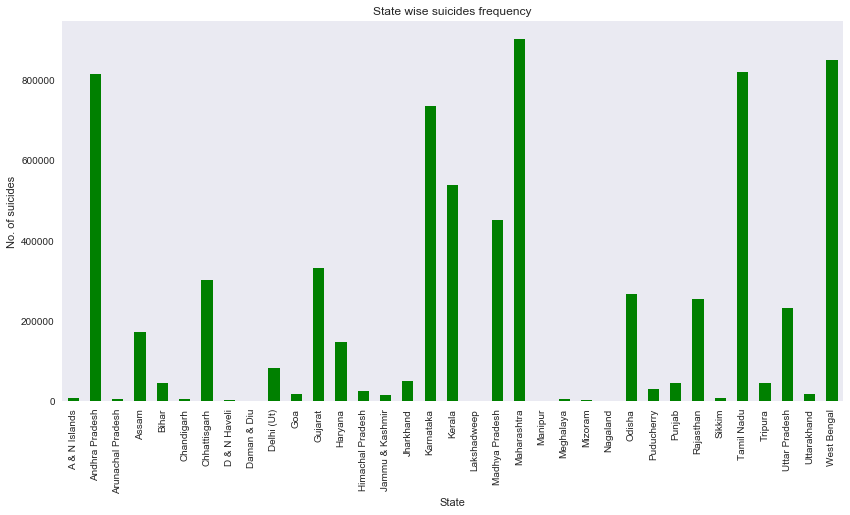

In [17]:
plt.xlabel('State')             # giving label to x axis
plt.ylabel('No. of suicides')   # giving label to y axis
plt.grid(False)
plt.show()                      # showing plot

#### Maharashtra,Andhra Pradesh and West Bengal have highest suicide rates

In [18]:
# Year wise suicide frequency
df.groupby('Year').sum()['Total'].plot("bar",figsize=(10,7),title ="Year wise suicides frequency",color='g')

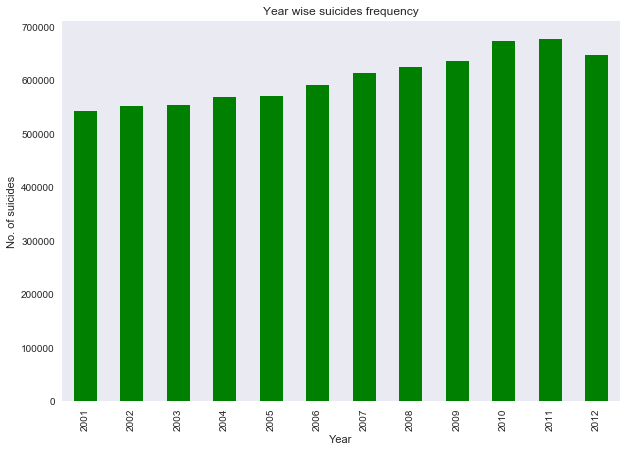

In [19]:
plt.xlabel('Year')             # giving label to x axis
plt.ylabel('No. of suicides')   # giving label to y axis
plt.grid(False)
plt.show()                      # showing plot

#### No. of suicides increasing continuously

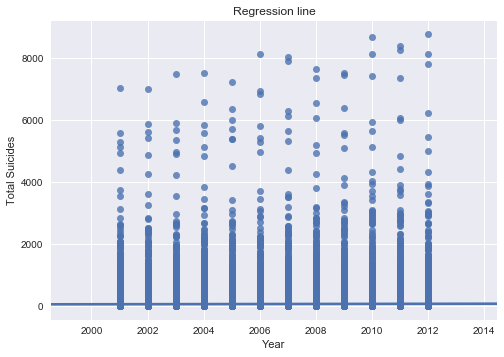

In [20]:
# No. of suicides are increasing 
sns.regplot(x="Year", y="Total", data=df)
plt.xlabel('Year')
plt.ylabel('Total Suicides')
plt.title('Regression line')
plt.show()

In [2]:
from numpy import median
from numpy import average
sns.pointplot(x="Year", y="Total", data=df, estimator=average, color='red');
sns.pointplot(x="Year", y="Total", data=df, estimator=median, color='green');
plt.xlabel('Year')
plt.ylabel('Total Suicides')
plt.title('Average(red) and median(green) for deaths ages by suicide per year')
plt.show()

NameError: name 'sns' is not defined

## Suicides analysis based on gender 

In [22]:
# Gender wise suicide frequency
df.groupby('Gender').sum()['Total'].plot("bar",figsize=(5,7),title ="Gender wise suicides frequency",color='g')

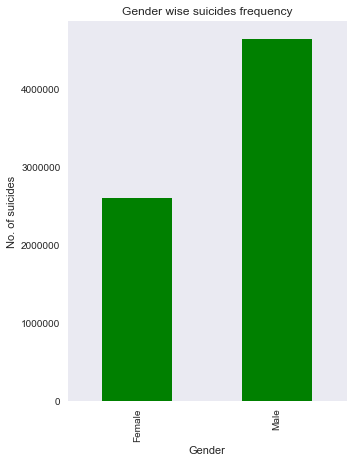

In [23]:
plt.xlabel('Gender')            # giving label to x axis
plt.ylabel('No. of suicides')   # giving label to y axis
plt.grid(False)
plt.show()                      # showing plot

In [24]:
#suicides based on gender 
s = df.groupby(['Gender'])['Total'].mean()
s.plot.pie(colors=['orange', 'grey'],autopct='%.2f', fontsize=20, figsize=(6, 6))
plt.title('Percentage of male and female suicide in india')

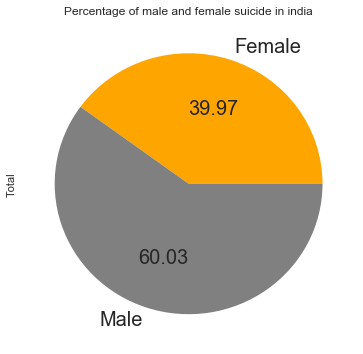

In [25]:
plt.show()

#### Males more susceptible towards suicides than females

In [26]:
# Factors considered
print(df.Type_code.unique())

['Causes' 'Education_Status' 'Means_adopted' 'Professional_Profile'
 'Social_Status']


In [27]:
# Different causes of suicides
df2=df[df.Type_code == 'Causes']
print(df2.Type.unique())

['Love Affairs' 'Other Causes (Please Specity)' 'Other Prolonged Illness'
 'Failure in Examination' 'Causes Not known' 'Family Problems'
 'Insanity/Mental Illness' 'Death of Dear Person' 'Unemployment'
 'Fall in Social Reputation' 'Suspected/Illicit Relation'
 'Cancellation/Non-Settlement of Marriage'
 'Not having Children(Barrenness/Impotency' 'Poverty'
 'Professional/Career Problem' 'Paralysis'
 'Bankruptcy or Sudden change in Economic' 'Divorce' 'Cancer'
 'Property Dispute' 'Illness (Aids/STD)'
 'Physical Abuse (Rape/Incest Etc.)' 'Drug Abuse/Addiction'
 'Ideological Causes/Hero Worshipping' 'Dowry Dispute'
 'Illegitimate Pregnancy' 'Bankruptcy or Sudden change in Economic Status'
 'Not having Children (Barrenness/Impotency']


## Age group wise suicides among states

In [28]:
# Age group wise suicide frequency
df[df['Age_group'] != '0-100+'].groupby('Age_group').sum()['Total'].plot("bar",figsize=(10,7),title ="Age group wise suicides frequency",color='g')

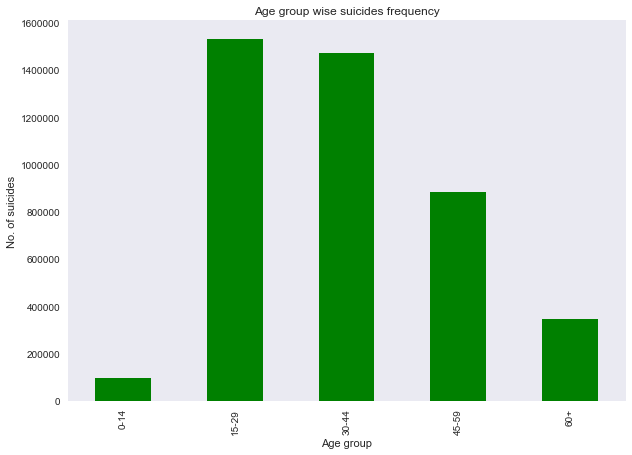

In [29]:
plt.xlabel('Age group')             # giving label to x axis
plt.ylabel('No. of suicides')   # giving label to y axis
plt.grid(False)
plt.show()                      # showing plot

#### Suicides more common in age group 15-44.Adolescents and adults are more likely to commit suicide.

In [30]:
# Age group wise suicides among states
data = []
s = df.State.unique()
for v in s:
    d= df[df['State']==v].groupby('Age_group').sum()
    w = np.array(d['Total'].values)
    data.append(w)
    
df3 = pd.DataFrame(data, index=s)
df3.plot.bar(figsize=(12,8),stacked =True)
plt.title("Age_group wise suicides among states",fontsize=30,color='navy')
plt.legend(d.index)
plt.xlabel("State",fontsize=20)
plt.ylabel("Suicides Count",fontsize=20)


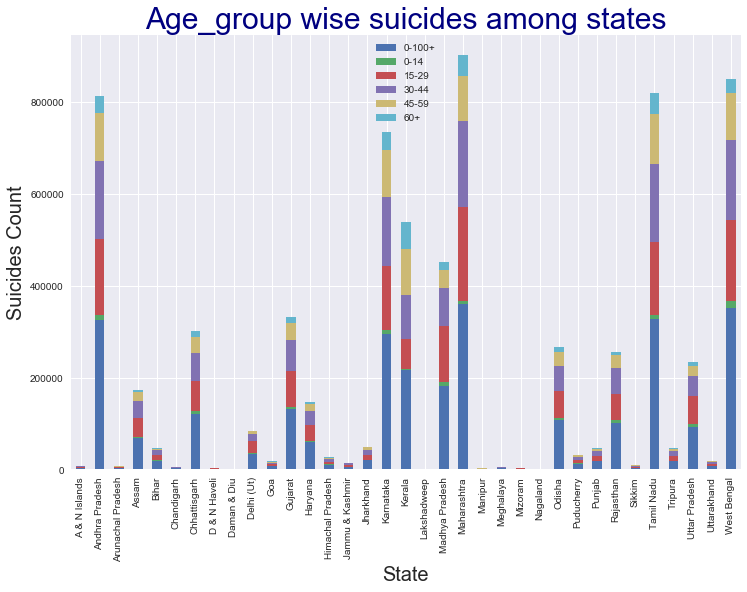

In [31]:
plt.show()

# Education status effect over the years

In [32]:
data = []
s = df.Year.unique()
ds = df[df['Type_code'] == 'Education_Status']
for v in s:
    d= ds[ds['Year']==v].groupby('Type').sum()
    w = np.array(d['Total'].values)
    data.append(w)
    
df4 = pd.DataFrame(data, index=s)
df4.plot(figsize=(12,8),stacked =False)
plt.title("Type(Education_Status) effect over the Years",fontsize=30)
plt.legend(d.index)
plt.xlabel("Year",fontsize=20)
plt.ylabel("Suicides Count",fontsize=20)


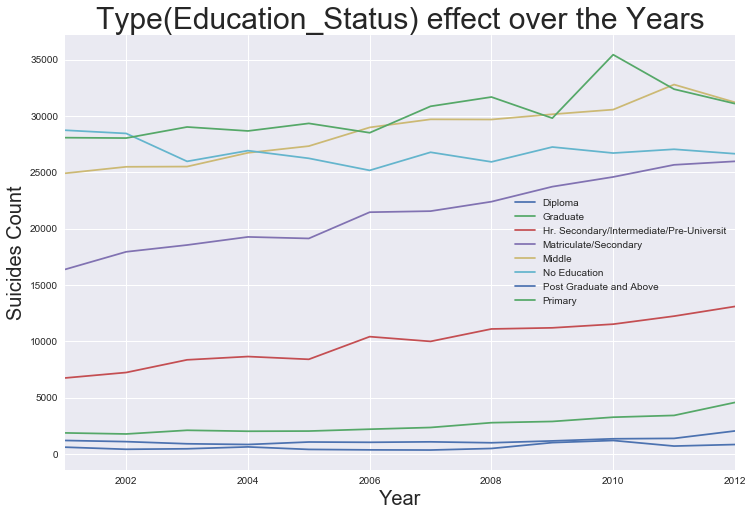

In [33]:
plt.show()

In [34]:
df4.plot.bar(figsize=(12,8),stacked =True)
plt.title("Type(Education_Status) effect over the Year",fontsize=30)
plt.legend(d.index)
plt.xlabel("Year",fontsize=20)
plt.ylabel("Suicides Count",fontsize=20)

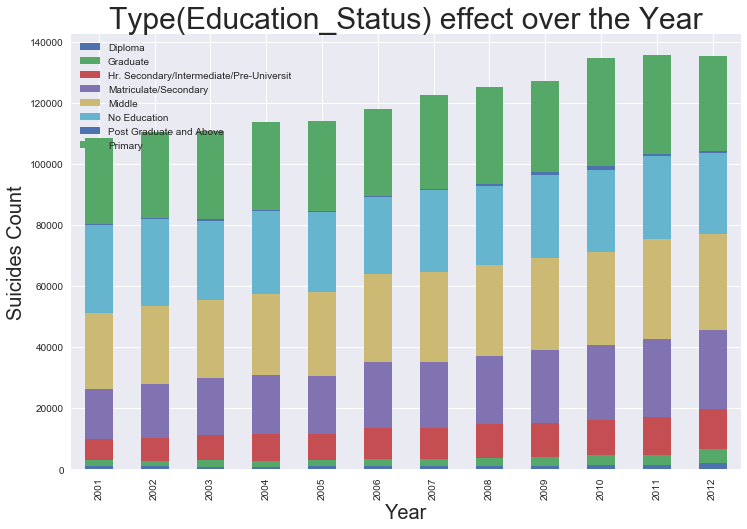

In [35]:
plt.show()

In [36]:
educ_level_df=df[df.Type_code=='Education_Status']
color_code = ["#e74c3c", "#3498db"]
plot = sns.factorplot(x='Type', y='Total', kind='bar', data=educ_level_df, estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');

# plot color coded by __Gender__
plot = sns.factorplot(x='Type', y='Total', hue='Gender', kind='bar',\
                      data=educ_level_df, palette=sns.color_palette(color_code),\
                      estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');

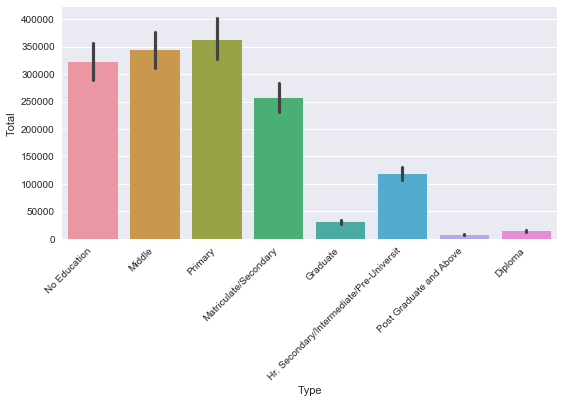

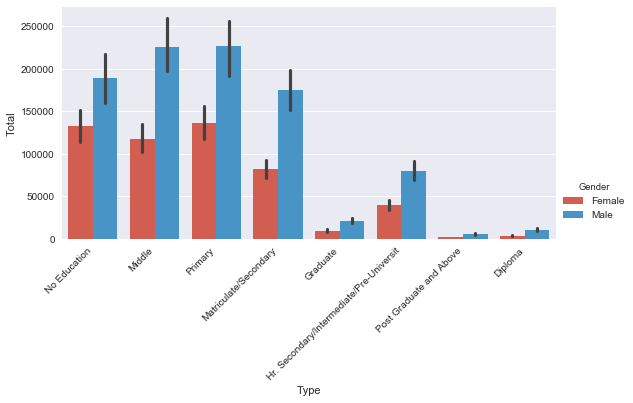

In [37]:
plt.show()

#### Suicide is mostly committed by individuals in the lower educational bracket in the population and the distribution is consistent for both genders.

## Causes of suicides over the years :

In [38]:
# Causes of suicides over the years
data = []
s =  df.Year.unique()
ds = df[df['Type_code'] == 'Causes']
for v in s:
    d= ds[ds['Year']==v].groupby('Type').sum()
    w = np.array(d['Total'].values)
    data.append(w)
    
df5 = pd.DataFrame(data, index=s)
df5.plot(figsize=(13,10),stacked =False)
plt.title("Type(Causes) over the Years",fontsize=30,color='blue')
plt.legend(d.index)
plt.xlabel("Year",fontsize=20,color='green')
plt.ylabel("Suicides Count",fontsize=20,color='green')

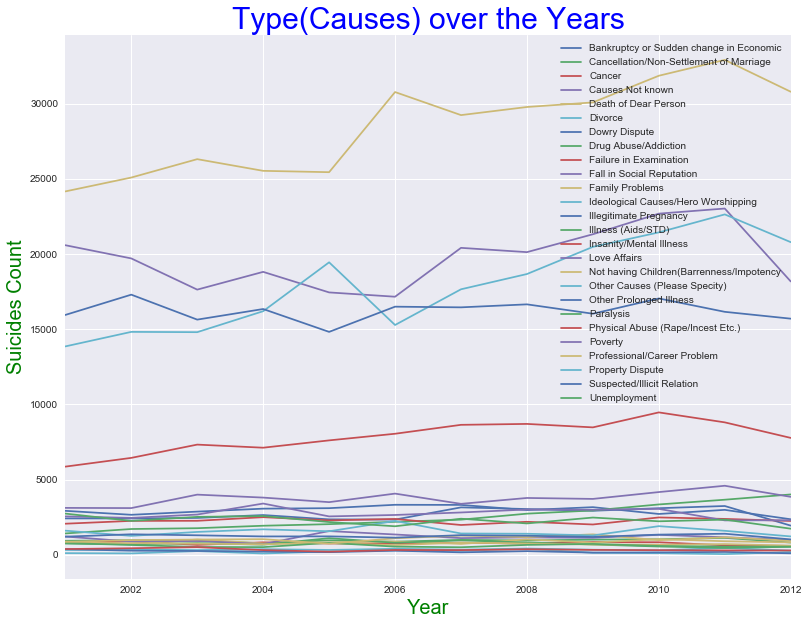

In [39]:
plt.show()

In [40]:
df5.plot.bar(figsize=(12,8),stacked =True)
plt.title("Type(Causes) over the Years",fontsize=30,color='blue')
plt.legend(d.index)
plt.xlabel("Year",fontsize=20,color='green')
plt.ylabel("Suicides Count",fontsize=20,color='green')

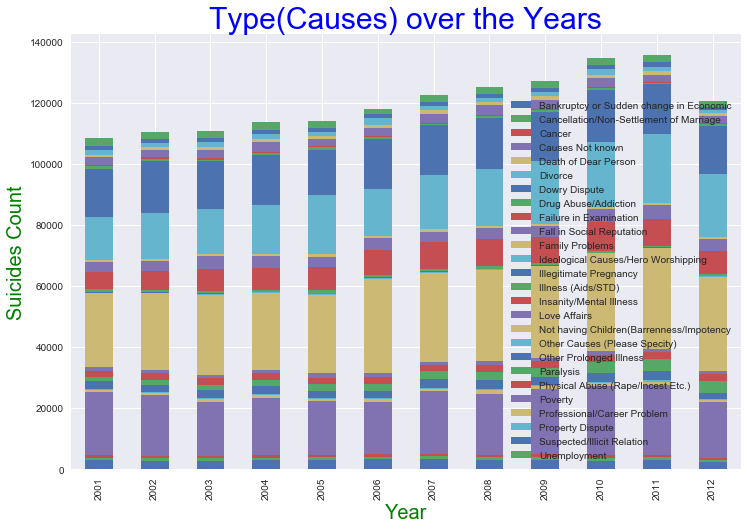

In [41]:
plt.show()

In [42]:
#heatmap showing the relation between the causes of suicide and year wise suicide frequency 

a1=df.loc[df.State=='Maharashtra']
a2=df.loc[df.State=='Andhra Pradesh']
a3=df.loc[df.State=='Tamil Nadu']
a4=df.loc[df.State=='Karnataka']
a5=df.loc[df.State=='West Bengal']

a1=a1.append(a2)
a1=a1.append(a3)
a1=a1.append(a4)
a1=a1.append(a5)

s = a1.groupby(['Type','Year'])['Total'].mean().reset_index().sort_values('Total',ascending=False)

trace = go.Heatmap(z=s['Total'],
                   x=s['Year'],
                   y=s['Type'])
d=[trace]
figure = dict(data = d)
iplot(figure)

In [43]:
causes_df=df[df.Type_code=='Causes']
plot = sns.factorplot(x='Type', y='Total', kind='bar', data=causes_df, estimator=sum ,size=6, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');
plot = sns.factorplot(x='Type', y='Total', hue='Gender', kind='bar',\
                      data=causes_df, palette=sns.color_palette(color_code),\
                      estimator=sum ,size=6, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');

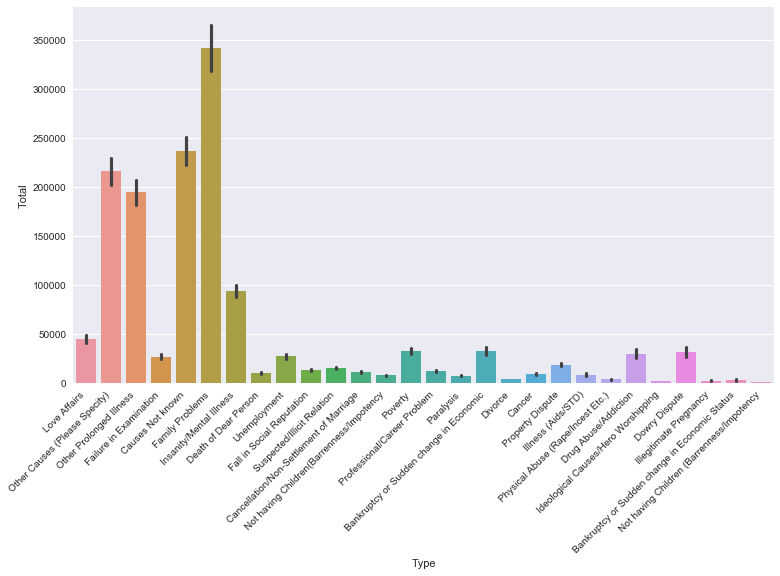

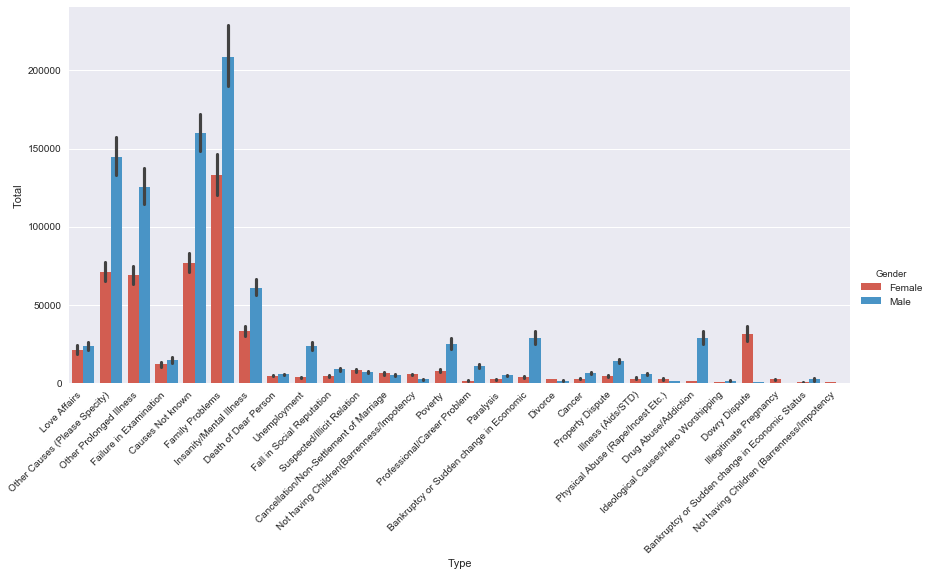

In [44]:
plt.show()

#### The leading cause of suicide is the Family problem, which is in line with the observation of that married groups are more likely to commit suicide, followed by Prolonged illness and Insanity/Mental Ilness.The only difference between males and females on in the order of types of suicide causes is on "Dowry Dispute", Suspected/Illicit Relation and Cancellation/None-Settlement of Marriage where female suicide has a higher rate.

## Social Status effect over the years

In [45]:
# Social Status effect over the years
data = []
s = df.Year.unique()
ds = df[df['Type_code'] == 'Social_Status']
for v in s:
    d= ds[ds['Year']==v].groupby('Type').sum()
    w = np.array(d['Total'].values)
    #print(v,d['Total'].values)
    data.append(w)

df6 = pd.DataFrame(data, index=s)
df6.plot(figsize=(12,8),stacked =False)
plt.title("Type(Social_Status) over Years",fontsize=30,color='green')
plt.legend(d.index)
plt.xlabel("Year",fontsize=20,color='navy')
plt.ylabel("Suicides Count",fontsize=20,color='navy')

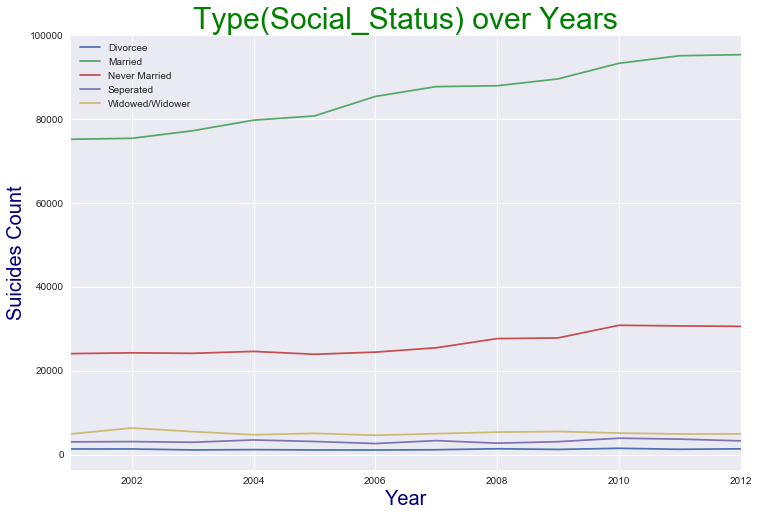

In [46]:
plt.show()

In [47]:
soc_stat_df=df[df.Type_code=='Social_Status']
plot = sns.factorplot(x='Type', y='Total', kind='bar', data=soc_stat_df, estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');
# color by gender
plot = sns.factorplot(x='Type', y='Total', hue ='Gender', kind='bar',\
                      data=soc_stat_df, palette=sns.color_palette(color_code),\
                      estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');

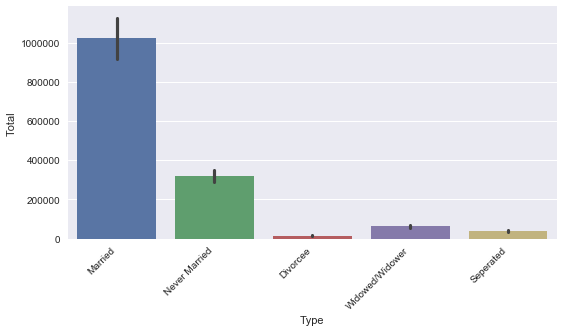

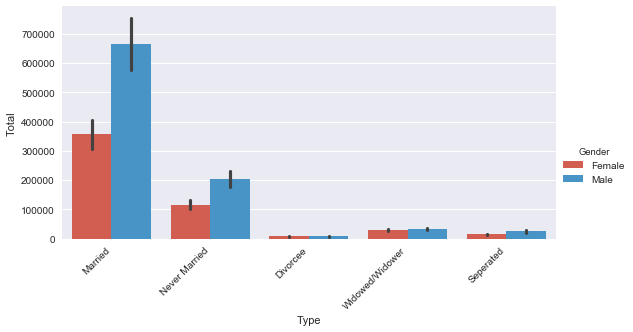

In [48]:
plt.show()

#### Married individuals are more likely to commit suicide.

## Means adopted

In [49]:
# Means adopted
data = []
s = df.Year.unique()
ds = df[df['Type_code'] == 'Means_adopted']
for v in s:
    d= ds[ds['Year']==v].groupby('Type').sum()
    w = np.array(d['Total'].values)
    #print(v,d['Total'].values)
    data.append(w)

df7 = pd.DataFrame(data, index=s)
df7.plot(figsize=(15,8),stacked =False)
plt.title("Means Adopted",fontsize=30,color='green')
plt.legend(d.index)
plt.xlabel("Year",fontsize=20,color='green')
plt.ylabel("Suicides Count",fontsize=20,color='green')

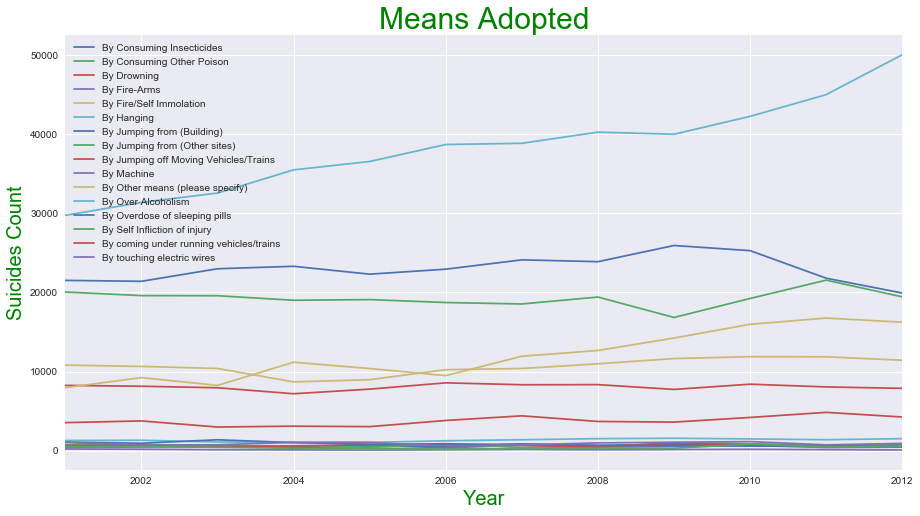

In [50]:
plt.show()

In [51]:
df7.plot.bar(figsize=(15,8),stacked =True)
plt.title("Means Adopted",fontsize=30,color='green')
plt.legend(d.index)
plt.xlabel("Year",fontsize=20,color='green')
plt.ylabel("Suicides Count",fontsize=20,color='green')

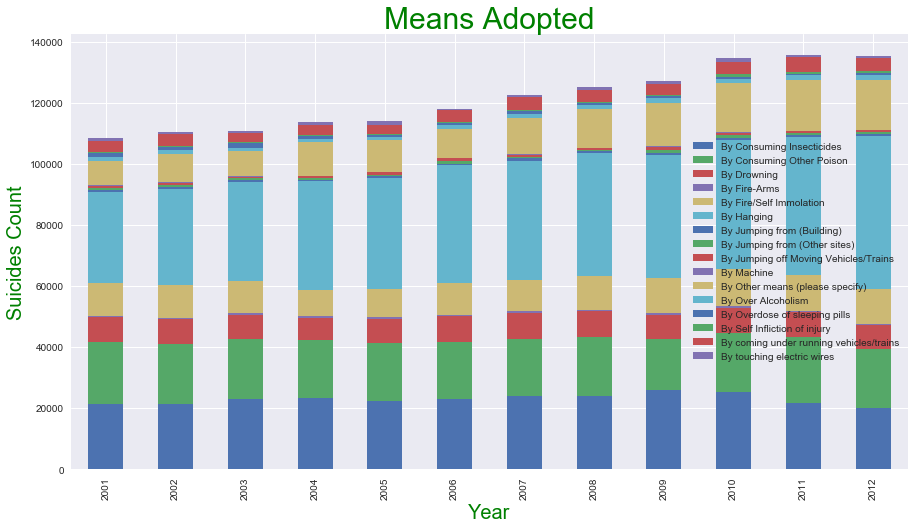

In [52]:
plt.show()

In [53]:
means_df = df[df.Type_code == 'Means_adopted']
plot = sns.factorplot(x='Type', y='Total', kind='bar', data=means_df, estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');
plot = sns.factorplot(x='Type', y='Total',  hue="Gender", kind='bar',\
                      data=means_df, estimator=sum, palette=sns.color_palette(color_code), size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');

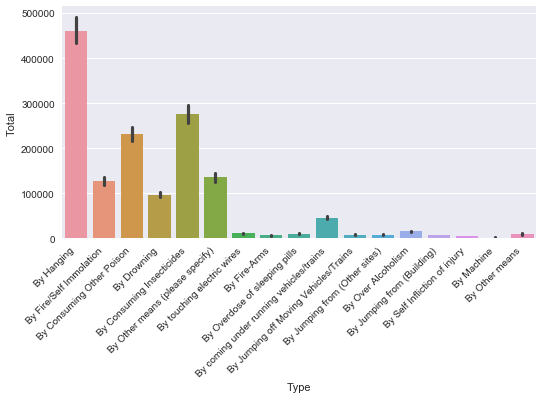

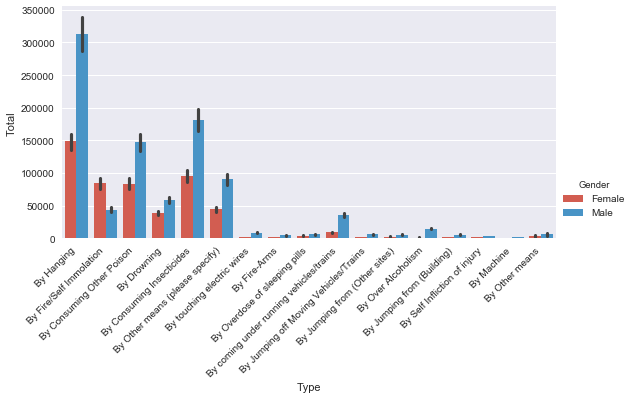

In [54]:
plt.show()

## Professional_Profile

In [55]:
# Professional_Profile
data = []
s = df.Year.unique()
ds = df[df['Type_code'] == 'Professional_Profile']
for v in s:
    d= ds[ds['Year']==v].groupby('Type').sum()
    w = np.array(d['Total'].values)
    #print(v,d['Total'].values)
    data.append(w)

df8 = pd.DataFrame(data, index=s)
df8.plot(figsize=(12,8),stacked =False)
plt.title("Professional_Profile",fontsize=30,color='green')
plt.legend(d.index)
plt.xlabel("Year",fontsize=20,color='green')
plt.ylabel("Suicides Count",fontsize=20,color='green')

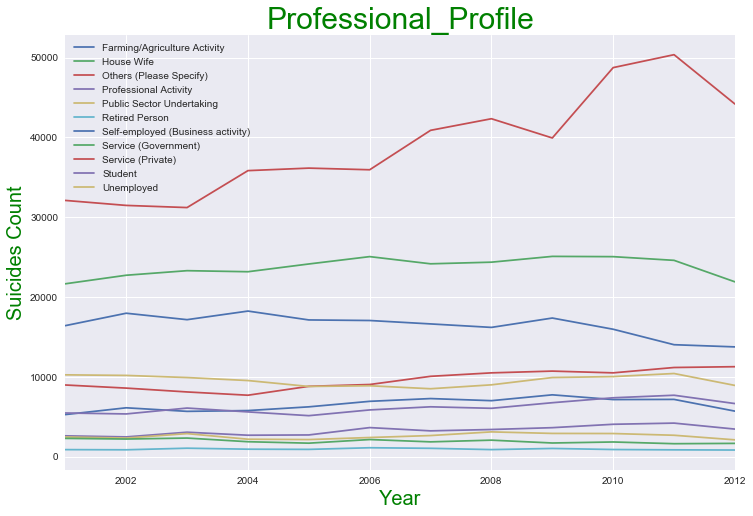

In [56]:
plt.show()

In [57]:
df8.plot.bar(figsize=(12,8),stacked =True)
plt.title("Professional_Profile",fontsize=30,color='green')
plt.legend(d.index)
plt.xlabel("Year",fontsize=20,color='green')
plt.ylabel("Suicides Count",fontsize=20,color='green')

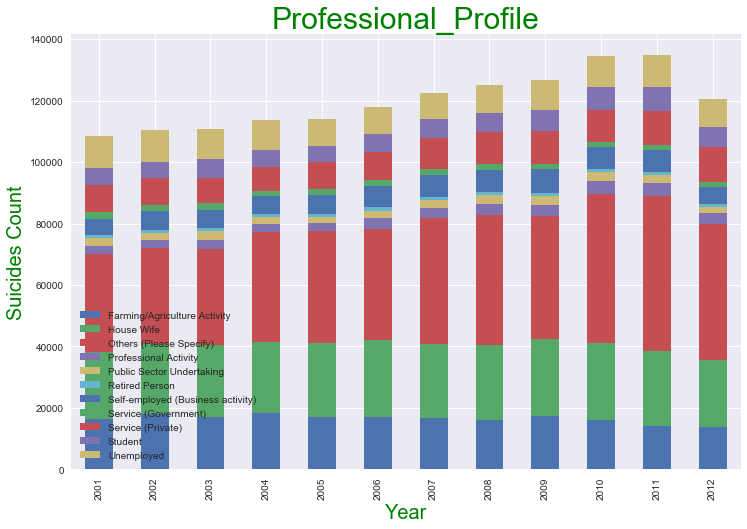

In [58]:
plt.show()

In [59]:
prof_stat_df=df[df.Type_code=='Professional_Profile']
plot = sns.factorplot(x='Type', y='Total', kind='bar', data=prof_stat_df, estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');

plot = sns.factorplot(x='Type', y='Total', hue ='Gender', kind='bar',\
                      data=prof_stat_df, palette=sns.color_palette(color_code),\
                      estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');

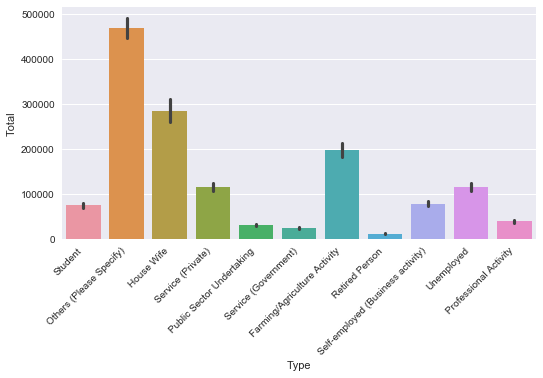

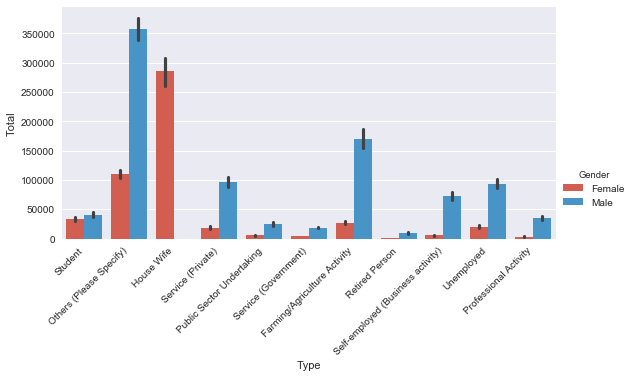

In [60]:
plt.show()

#### The highest reported category is house wife following by the Farming/Agri Like before the distribution is the same for both genders except not surprisingly the house wife, which are Female only.

## How can the government help?

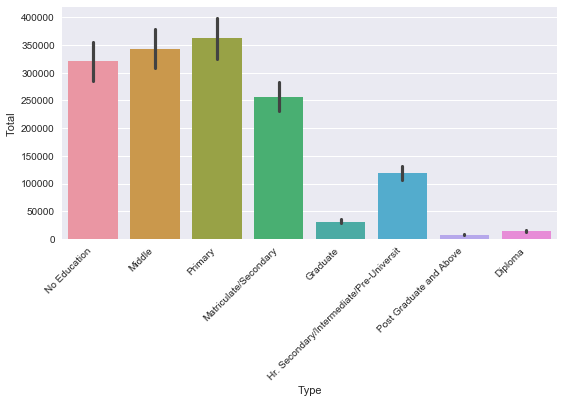

In [61]:
plot = sns.factorplot(x='Type', y='Total', kind='bar', data=educ_level_df, estimator=sum, size=4, aspect=2)
plot.set_xticklabels(rotation=45, horizontalalignment='right');
plt.show()

#### The more educated a person is, the less likely would they be to commit suicide. The government can make sure people have access to schools and colleges that have adequate facilities and teaching personnel.

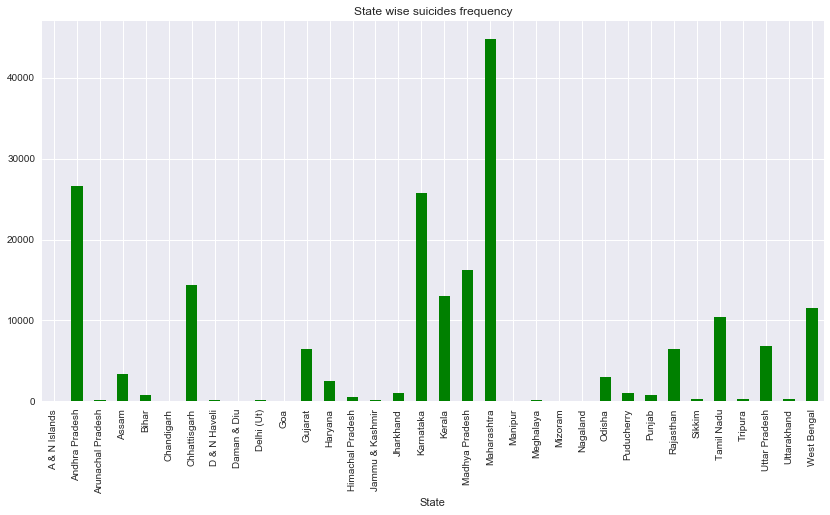

In [62]:
farmer_df=df[(df.Type_code == 'Professional_Profile') & (df.Type == 'Farming/Agriculture Activity')]
farmer_df.groupby('State').sum()['Total'].plot("bar",figsize=(14,7),title ="State wise suicides frequency",color='g')
plt.show()

#### Farmers from the southern and the central states seem to be suffering the most. This could due to a number of factors:

* depletion of water table
* rivers drying up
* extreme monsoons
* poor water management
* improper farming techniques
* dependence on water guzzling crops

#### However, the government could provide some of the following relief measures:

* better water management
* desalinized water
* seed/fertilizer subsidiary
* loan waiver
* new technology

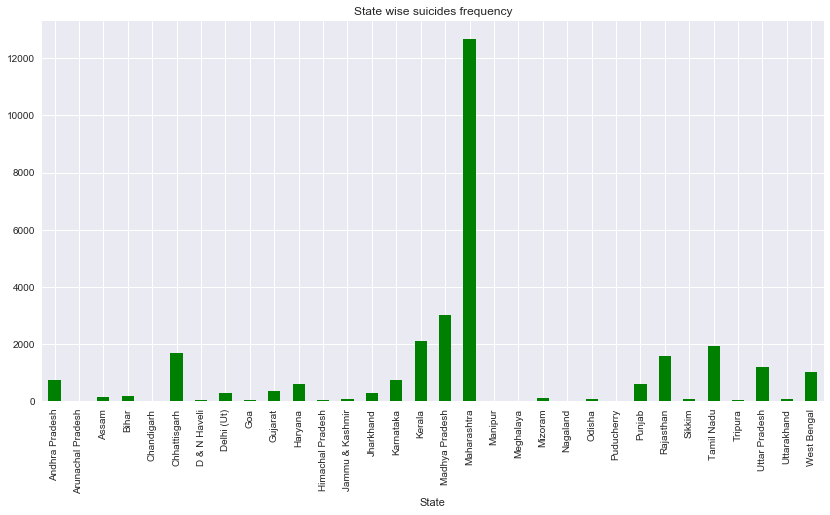

In [63]:
drug_df=df[df.Type == 'Drug Abuse/Addiction']
drug_df.groupby('State').sum()['Total'].plot("bar",figsize=(14,7),title ="State wise suicides frequency",color='g')
plt.show()

#### Maharashtra seen to have the highest drug abuse related suicides 
#### The government can approach this problem by cracking down on the supply of drugs and also by providing rehabilitation for the addicts to prevent suicide.

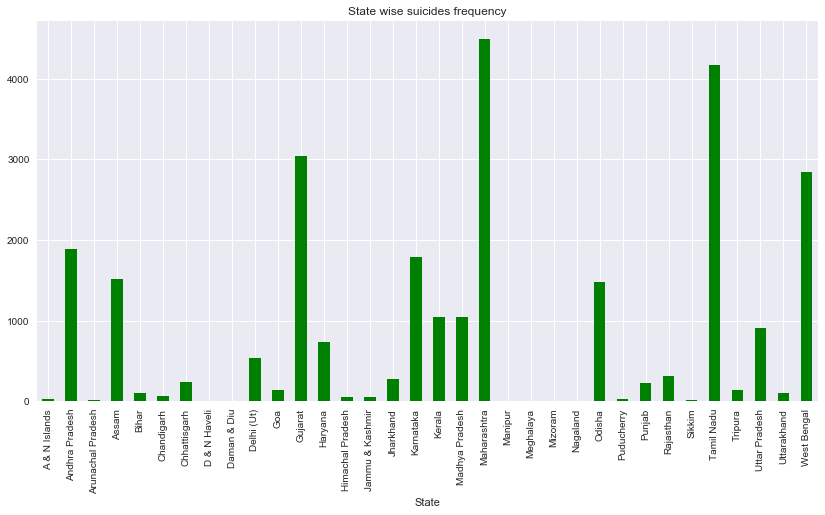

In [64]:
employment_df=df[df.Type == 'Unemployment']
employment_df.groupby('State').sum()['Total'].plot("bar",figsize=(14,7),title ="State wise suicides frequency",color='g')
plt.show()

#### Unemployment is also a big issue. Government must provide job opportunities

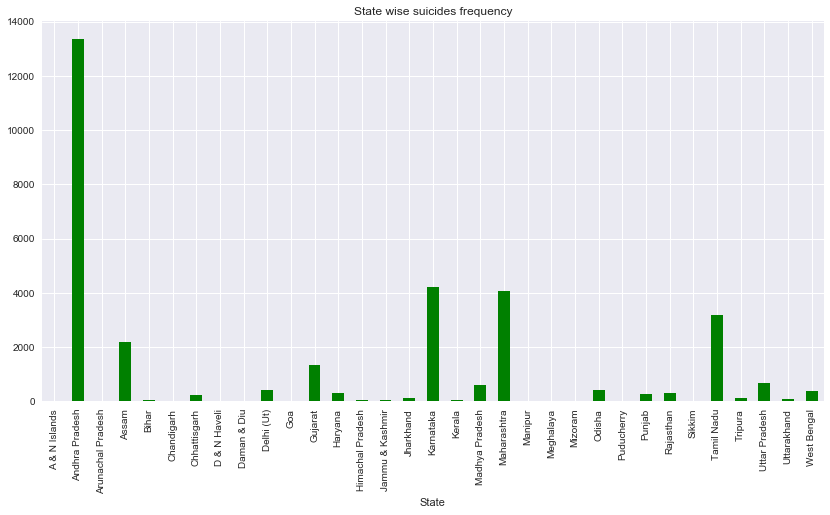

In [65]:
poverty_df=df[df.Type == 'Poverty']
poverty_df.groupby('State').sum()['Total'].plot("bar",figsize=(14,7),title ="State wise suicides frequency",color='g')
plt.show()

#### Steps must be taken to eradicate poverty

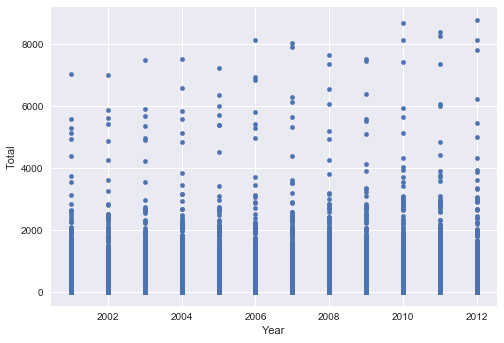

In [66]:
# 2D Scatter Plots : to check correlation between features
df.plot.scatter(x='Year',y='Total')
plt.show()

## Feature Representation ; converting features into numeric

In [67]:
df['Gender1'] = df.Gender.astype('category').cat.codes
df['State1'] = df.State.astype('category').cat.codes
df['Type1'] = df.Type.astype('category').cat.codes
df['Type_code1'] = df.Type_code.astype('category').cat.codes
df['Age_group1'] = df.Age_group.astype('category').cat.codes

In [68]:
df.head()

,State,Year,Type_code,Type,Gender,Age_group,Total,Gender1,State1,Type1,Type_code1,Age_group1
13,A & N Islands,2001,Causes,Love Affairs,Female,0-14,1,0,0,39,0,1
20,A & N Islands,2001,Causes,Other Causes (Please Specity),Female,0-14,1,0,0,47,0,1
32,A & N Islands,2001,Causes,Other Prolonged Illness,Male,0-14,1,1,0,48,0,1
47,A & N Islands,2001,Causes,Failure in Examination,Male,0-14,1,1,0,28,0,1
54,A & N Islands,2001,Causes,Other Prolonged Illness,Female,15-29,8,0,0,48,0,2


## 3D Scatter Plots

In [69]:
from mpl_toolkits.mplot3d import Axes3D

In [70]:
fig=plt.figure()
plt.suptitle('Year*Total_suicides*Gender')
ax=fig.add_subplot(111,projection='3d')
ax.set_xlabel('Year')
ax.set_ylabel('Total Suicides')
ax.set_zlabel('Gender')
ax.scatter(df.Year,df.Total,df.Gender1,c="r",marker="o")

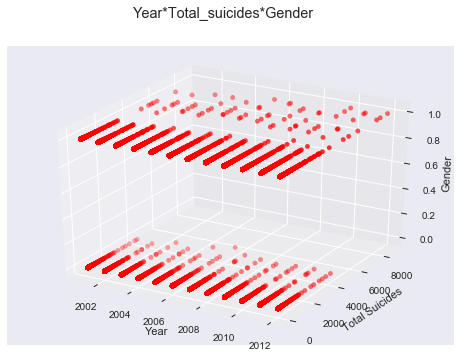

In [71]:
plt.show()

In [72]:
fig=plt.figure()
plt.suptitle('Year*Total_suicides*Age_group')
ax=fig.add_subplot(111,projection='3d')
ax.set_xlabel('Year')
ax.set_ylabel('Total Suicides')
ax.set_zlabel('Age_group')
ax.scatter(df.Year,df.Total,df.Age_group1,c="g",marker="o")

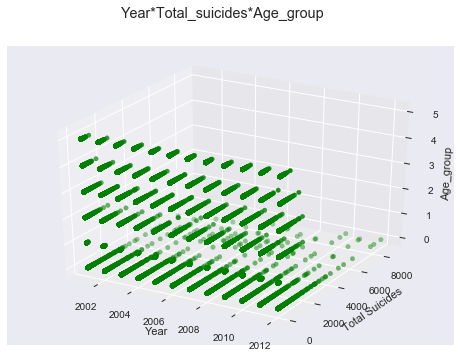

In [73]:
plt.show()

In [74]:
# Another dataset
table = pd.read_excel('C:/Users/sande/Minor Project/Dataset/mergedData.xlsx')

In [75]:
table.head()

,Country,2015_s,2010_s,2015_p,2013_p,2010_p,2013_d,suiAve,suiPerDeath,deaPerPop
0,Afghanistan,5.5,5.2,32526.6,30682.5,27962.2,7.7,5.35,0.694805,0.77
1,Albania,4.3,5.3,2896.7,2883.3,2901.9,9.4,4.80,0.510638,0.94
2,Algeria,3.1,3.4,39666.5,38186.1,36036.2,5.7,3.25,0.570175,0.57
3,Angola,20.5,20.7,25022.0,23448.2,21220.0,13.9,20.60,1.482014,1.39
4,Antigua and Barbuda,0.0,0.2,91.8,90.0,87.2,6.8,0.10,0.014706,0.68


In [76]:
table.shape

(183, 10)

In [77]:
#variables
x = table.index
y = table['suiPerDeath']
size = table['deaPerPop']
tLabels = table['Country']
yMax = round(y.max()) + 1
xMax = x.max() + 1
x

Int64Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
            ...
            173, 174, 175, 176, 177, 178, 179, 180, 181, 182],
           dtype='int64', length=183)

In [78]:
y.head()

0    0.694805
1    0.510638
2    0.570175
3    1.482014
4    0.014706
Name: suiPerDeath, dtype: float64

In [79]:
size.head()

0    0.77
1    0.94
2    0.57
3    1.39
4    0.68
Name: deaPerPop, dtype: float64

In [80]:
yMax

7.0

In [81]:
fig, ax = plt.subplots(figsize=(10, 4), dpi=200, facecolor='white')
im = ax.scatter(x, y, s=size * 30, alpha=0.6, linewidth='0.2')

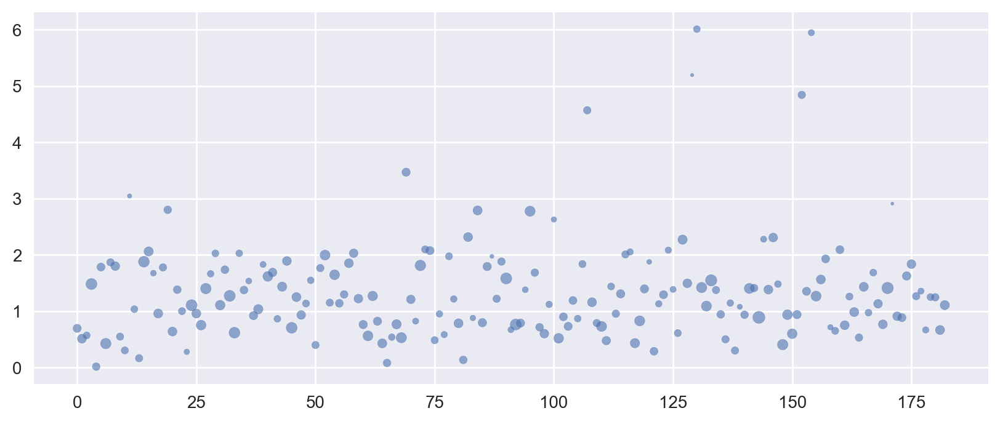

In [82]:
plt.show()

In [83]:
import matplotlib as mpl
lightBlack = '#3e3e3e'
fig, ax = plt.subplots(figsize=(10, 4), dpi=200, facecolor='white')

im = ax.scatter(x, y, s=size * 30, c=table['2010_s'] * table['2013_p'] / 100, 
                norm=mpl.colors.LogNorm(), cmap='YlOrRd', alpha=0.6, 
                linewidth='0.2', edgecolor=lightBlack, label='_nolegend_')

ax.set(xlim=[-1,xMax], ylim=[0, yMax], xticks=x)
im.set_clim(vmin=1, vmax=1000000)
# We can add labels to the x and y axes
ax.set_xlabel('Country list', fontsize=8)
ax.set_ylabel('Suicide per Death %', fontsize=8)

# Custom added plot title using 'ax.text' function
ax.text(0.5, 1.04, 'Suicide per Death % by Country', horizontalalignment='center',fontsize=14, transform = ax.transAxes)

# Setting x tick labels to the country list.
ax.set_xticklabels(tLabels, rotation='vertical', size=3)

# Adding colorbar and adjusting some parameters.
cbar = fig.colorbar(im, label='Number of suicides')
cbar.ax.tick_params(labelsize=5);

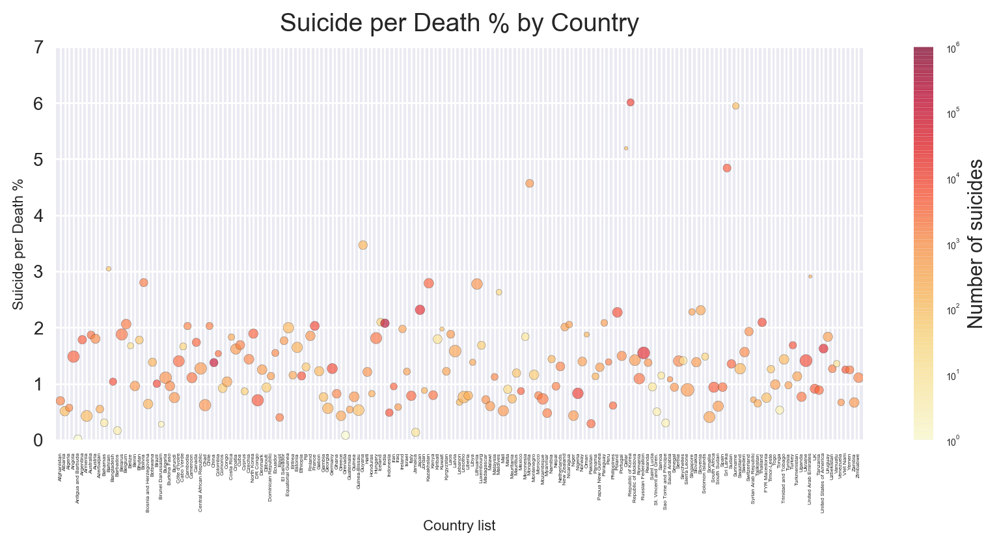

In [84]:
plt.show()